In [1]:
# define logging and working directory
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()
from src.utils.notebook_imports import *
from pyforest import *
Console_and_file_logger('volume_calculation', logging.INFO)


import SimpleITK as sitk
import random
from collections import Counter
from ipywidgets import interact

%matplotlib inline
plt.rcParams.update({'font.size': 30})
%reload_ext autoreload
%autoreload 2


from src.utils.utils_io import Console_and_file_logger, ensure_dir
from src.visualization.Visualize import plot_3d_vol, plot_4d_vol, plot_value_histogram, show_2D_or_3D
from src.data.Dataset import get_metadata_maybe, filter_4d_vol, copy_meta_and_save, create_3d_volumes_from_4d_files, describe_sitk, describe_volume, describe_path, get_phase, is_patient_in_df, get_extremas



search for root_dir and set working directory
Working directory set to: /mnt/data/git/cardio


2020-01-23 15:17:07,833 INFO -------------------- Start --------------------
2020-01-23 15:17:07,833 INFO Working directory: /mnt/data/git/cardio.
2020-01-23 15:17:07,840 INFO Log file: ./logs/volume_calculation.log
Using TensorFlow backend.


# Load the dataframe with all values calculated

In [180]:
df_volumes = pd.read_csv('reports/vae/3d_gcn.csv')
df_volumes['phase'] = pd.Categorical(df_volumes.phase, 
                      categories=['ED','MS','ES','PF','MD'],
                      ordered=True)


# cleaning is maybe necessary for merging the outcome
# already done for this csv

#df_volumes['patient_dicom'] = df_volumes['patient_dicom'].apply(lambda x: str(x).replace(' ', ''))
#df_volumes['patient_dicom'] = df_volumes['patient_dicom'].apply(lambda x: str(x).replace('04NEJQU7', '04NEJQUZ'))
#df_volumes['patient_dicom'] = df_volumes['patient_dicom'].apply(lambda x: str(x).replace('PEXM9GE', 'PEXM9GEK'))
#df_volumes.drop(axis=1, columns=['Outcome y/n'], inplace=True)
#df_new = pd.read_excel('data/external/Outcome_TOF_GCN_HL_15072018_for Tarique and Sven.xlsx')
#df_new['PID'] = df_new['PID'].apply(lambda x: str(x).replace(' ', ''))
#df_merge= df_volumes.merge(df_new[['PID', 'Outcome y/n']], how='left', left_on='patient_dicom', right_on='PID')

# calculate the BSA and the relative volumes of the ventricles, already done in the csv
# calculate the relative volume, divide it by the body surface area (BSA) = (weicht * height)/3600
#df_volumes['bsa'] = df_volumes.apply(lambda x : (float(x['Physical Exam Height in cm (percentile) bodysize']) * float(x['Weight in kg (percentile) weight']))/3600, axis=1)
#df_volumes['lv_bsa'] = df_volumes.apply(lambda x : (float(x['lv']) / float(x['bsa'])), axis=1)
#df_volumes['rv_bsa'] = df_volumes.apply(lambda x : (float(x['rv']) / float(x['bsa'])), axis=1)
#df_volumes['myo_bsa'] = df_volumes.apply(lambda x : (float(x['myo']) / float(x['bsa'])), axis=1)


df_volumes.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,background,rv,myo,lv,y_path,t,t_norm,...,Type Outcome_y,Date Outcome,patient_unique,phase,PID_y,Outcome y/n,bsa,lv_bsa,rv_bsa,myo_bsa
0,0,0,0,11520,137,44,56,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,5,0,...,NaN,NaN,04NEJQUZ-2007-03-13,MS,04NEJQUZ,n,1.393333,40.191388,98.325359,31.578947
1,1,1,1,11589,98,35,37,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,12,1,...,NaN,NaN,04NEJQUZ-2007-03-13,ES,04NEJQUZ,n,1.393333,26.555024,70.334928,25.119617
2,2,2,2,11521,138,39,61,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,16,2,...,NaN,NaN,04NEJQUZ-2007-03-13,MD,04NEJQUZ,n,1.393333,43.779904,99.043062,27.990431
3,3,3,3,11465,165,47,81,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,20,3,...,NaN,NaN,04NEJQUZ-2007-03-13,PF,04NEJQUZ,n,1.393333,58.133971,118.421053,33.732057
4,4,4,4,11460,171,41,85,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,23,4,...,NaN,NaN,04NEJQUZ-2007-03-13,ED,04NEJQUZ,n,1.393333,61.004785,122.727273,29.425837


In [163]:
# how many patients from each class?, divide by number of phases per patient
a = df_volumes['Outcome y/n'].value_counts()
a[0]/5
a[1]/5

171.0

12.0

In [100]:
img_path = sorted(glob.glob(os.path.join('data/raw/GCN/3D/**/', '*msk.nrrd')))
len(img_path)

1030

In [101]:
def get_volumes(f_name):
    """
    expects a full filename for a nrrd mask
    returns: a dict with the format: {label1 : size1, label2 : size2 ...}
    volume size in ml^3, calculated with # voxels * spacing_x * spacing_y * spacing_z
    """
    # load image, transform to nda
    img = sitk.ReadImage(f_name)
    nda = sitk.GetArrayFromImage(img)
    
    # describe image, get dict of key, values
    descr = describe_volume(f_name)
    
    # helper, calculate the volume in ml for one label
    def calc_vol(index):
        return (nda==index).sum() * descr.get('x-spacing',1) * descr.get('y-spacing',1) * descr.get('z-spacing',1)//1000
    
    # calc volume for each label in ml, return a dict with label-value: volume-size in ml
    volumes = dict([(int(i),calc_vol(i)) for i in np.unique(nda)])
    return volumes

In [102]:
def get_date_from_columns(row):
    
    d = '{:02}'.format(int(row['DD']))
    m = '{:02}'.format(int(row['MM']))
    y = '{:04}'.format(int(row['YYYY']))
    return '{}-{}-{}'.format(y, m, d)
    
    

In [103]:
def get_date_from_filename(f_name):
    
    import re
    return re.findall(r'\d\d\d\d-\d\d-\d\d',f_name)[0]

In [104]:
@interact
def calc_vol_size_interact(f_name=img_path):
    """
    calculate the volume sizes for each label of a 3D volume
    """
    
    logging.info(f_name)
    img = sitk.ReadImage(f_name)
    nda = sitk.GetArrayFromImage(img)

    logging.info('Shape: {}'.format(img.GetSize()))
    logging.info('Spacing: {}'.format(img.GetSpacing()))
    logging.info('-'*20)
    logging.info('Backround voxels: {}'.format((nda==0).sum()))
    logging.info('RV voxels: {}'.format((nda==1).sum()))
    logging.info('Myo voxels: {}'.format((nda==2).sum()))
    logging.info('LV voxels: {}'.format((nda==3).sum()))
    
    #bsa = Wurzel(Größe [cm] x Gewicht [kg] / 3600)
    vols = get_volumes(f_name)
    logging.info('-'*20)
    logging.info('Background in ml: {}'.format(vols[0]))
    logging.info('RV in ml: {}'.format(vols[1]))
    logging.info('MYO in ml: {}'.format(vols[2]))
    logging.info('LV in ml: {}'.format(vols[3]))
    #describe_sitk(img)
    

interactive(children=(Dropdown(description='f_name', options=('data/raw/GCN/3D/test/0019-1EMMCVKN-2006-06-29__…

In [9]:
df_volumes.sort_values(['patient', 'phase'], inplace=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb8487604e0>]],
      dtype=object)

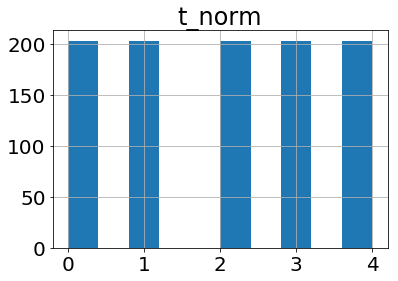

In [33]:
df_volumes[['t_norm']].hist()

In [34]:
df_volumes.head(10)

,index,Unnamed: 0,background,rv,myo,lv,y_path,t,t_norm,y_path.1,...,surgery date while enrolled in study OP Datum während Studie,tricuspid insufficiency grades 0-4 tricinsuf,Last Report Date_y,PVR nach MRT y/n,Date PVR,Outcome y/n,Type Outcome_y,Date Outcome,patient_unique,phase
0,4,4,11460,171,41,85,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,23,4,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,ED
1,0,0,11520,137,44,56,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,5,0,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,MS
2,1,1,11589,98,35,37,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,12,1,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,ES
3,3,3,11465,165,47,81,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,20,3,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,PF
4,2,2,11521,138,39,61,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,16,2,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,MD
5,9,9,6858,245,140,189,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,12,4,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,...,NaN,NaN,2016-05-25 00:00:00,n,NaN,n,"atrial flutter first occured 07/2002, since th...",NaN,0AE4R74L-1900-01-01,ED
6,5,5,7003,216,115,98,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,1,0,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,...,NaN,NaN,2016-05-25 00:00:00,n,NaN,n,"atrial flutter first occured 07/2002, since th...",NaN,0AE4R74L-1900-01-01,MS
7,6,6,7076,166,110,81,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,3,1,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,...,NaN,NaN,2016-05-25 00:00:00,n,NaN,n,"atrial flutter first occured 07/2002, since th...",NaN,0AE4R74L-1900-01-01,ES
8,7,7,6976,165,143,148,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,6,2,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,...,NaN,NaN,2016-05-25 00:00:00,n,NaN,n,"atrial flutter first occured 07/2002, since th...",NaN,0AE4R74L-1900-01-01,PF
9,8,8,6893,232,136,171,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,10,3,data/raw/GCN/3D/train/0006-0AE4R74L-1900-01-01...,...,NaN,NaN,2016-05-25 00:00:00,n,NaN,n,"atrial flutter first occured 07/2002, since th...",NaN,0AE4R74L-1900-01-01,MD


In [35]:
df_volumes.reset_index(inplace=True)
df_volumes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1015 entries, 0 to 1014
Columns: 152 entries, level_0 to phase
dtypes: bool(1), category(1), float64(78), int64(21), object(51)
memory usage: 1.2+ MB


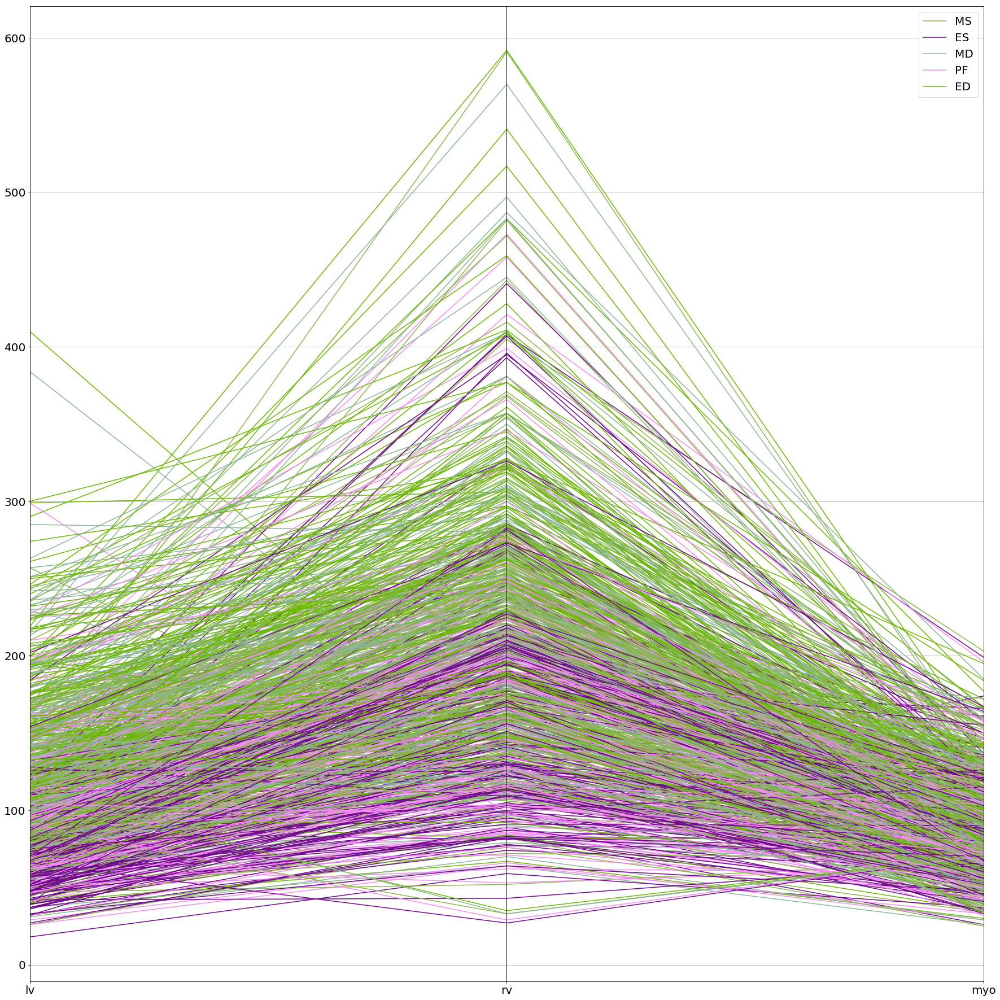

In [188]:
from pandas.plotting import parallel_coordinates
plt.rcParams.update({'font.size': 20})
fig, ax = plt.subplots(figsize=(25,25))
ax = parallel_coordinates(df_volumes[['phase','lv', 'rv', 'myo']], 'phase', ax=ax, sort_labels=True)

plt.tight_layout()

In [37]:
# transpose the myo volumes per patient in a new dataframe for plotting
patients = df_volumes['patient'].unique()
myos = []
for p in patients:
    myos.append(df_volumes[df_volumes['patient'] == p]['myo'].values[:5])
df_myos = pd.DataFrame(myos)
df_myos.head(5)


,0,1,2,3,4
0,41,44,35,47,39
1,140,115,110,143,136
2,65,51,57,52,63
3,75,71,63,64,73
4,119,111,127,111,114


In [38]:
df_myos.shape

(203, 5)

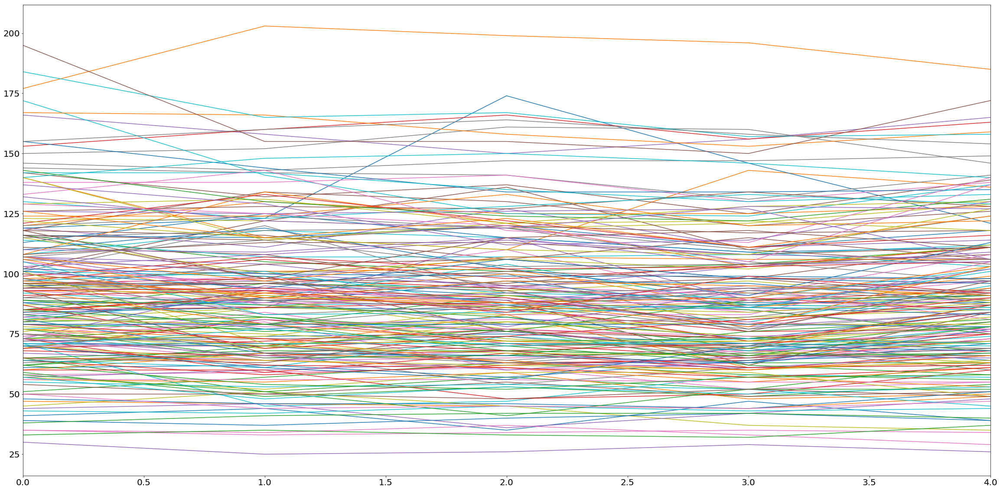

In [39]:
plt.rcParams.update({'font.size': 20})
fig, ax = plt.subplots(figsize=(40,20))
df_myos.T.plot.line(ax=ax, legend=False)

In [40]:
# transpose the rv volumes per patient in a new dataframe for plotting
patients = df_volumes['patient'].unique()
rvs = []
for p in patients:
    rvs.append(df_volumes[df_volumes['patient'] == p]['rv'].values[:5])
df_rvs = pd.DataFrame(rvs)
df_rvs.head(5)

,0,1,2,3,4
0,171,137,98,165,138
1,245,216,166,165,232
2,213,178,145,151,195
3,202,165,143,175,189
4,240,218,183,186,223


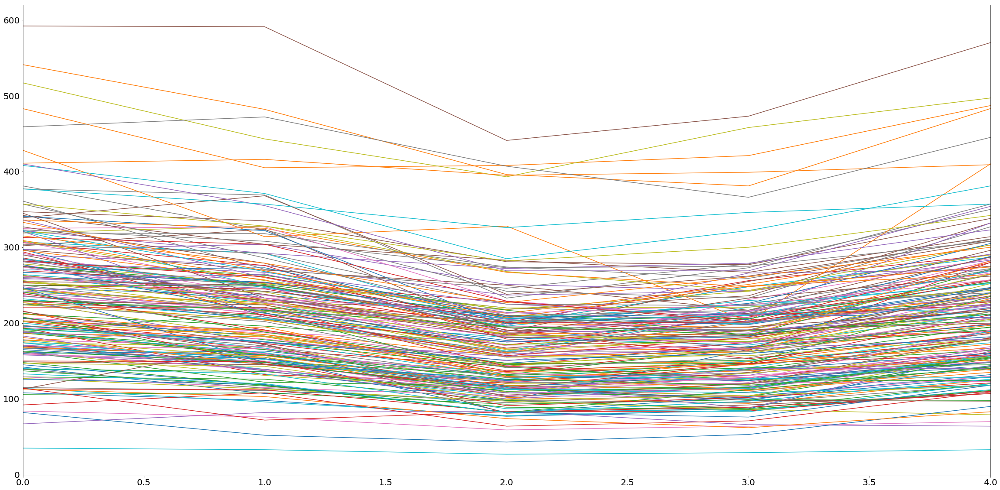

In [41]:
plt.rcParams.update({'font.size': 20})
fig, ax = plt.subplots(figsize=(40,20))
df_rvs.T.plot.line(ax=ax, legend=False)

In [42]:
# transpose the lv volumes per patient in a new dataframe for plotting
patients = df_volumes['patient'].unique()
lvs = []
for p in patients:
    lvs.append(df_volumes[df_volumes['patient'] == p]['lv'].values[:5])
df_lvs = pd.DataFrame(lvs)
df_lvs.head(5)

,0,1,2,3,4
0,85,56,37,81,61
1,189,98,81,148,171
2,130,73,56,86,118
3,129,87,64,122,126
4,166,105,62,130,155


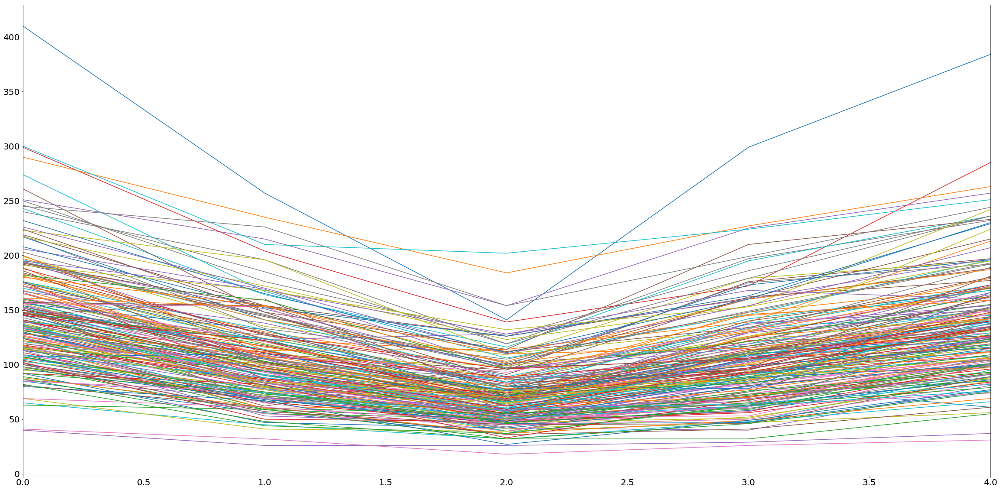

In [43]:
plt.rcParams.update({'font.size': 20})
fig, ax = plt.subplots(figsize=(40,20))
df_lvs.T.plot.line(ax=ax, legend=False)

Text(0.5, 1.0, 'mean lv change in ml')

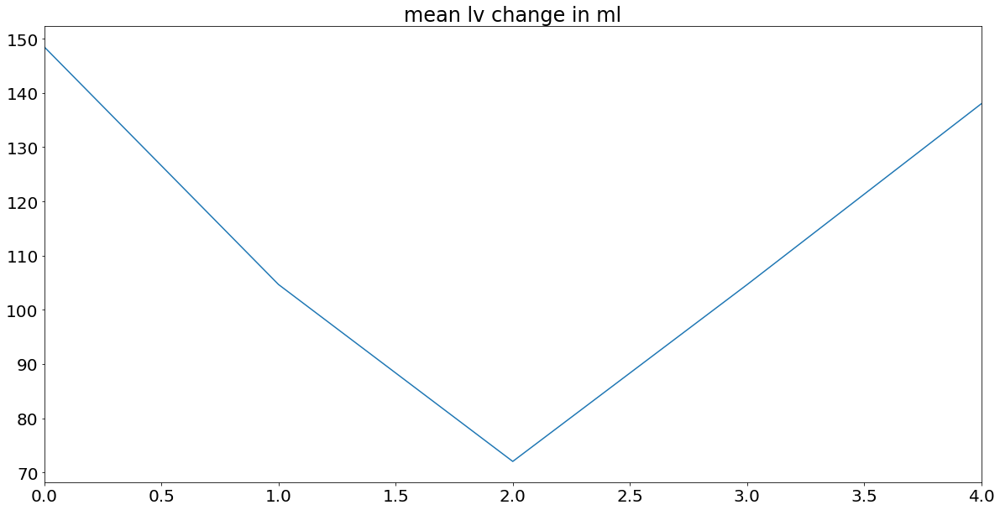

In [44]:
# plot mean lv shape
fig, ax = plt.subplots(figsize=(20,10))
df_lvs.mean().T.plot.line(ax=ax, legend=False)
plt.title('mean lv change in ml')

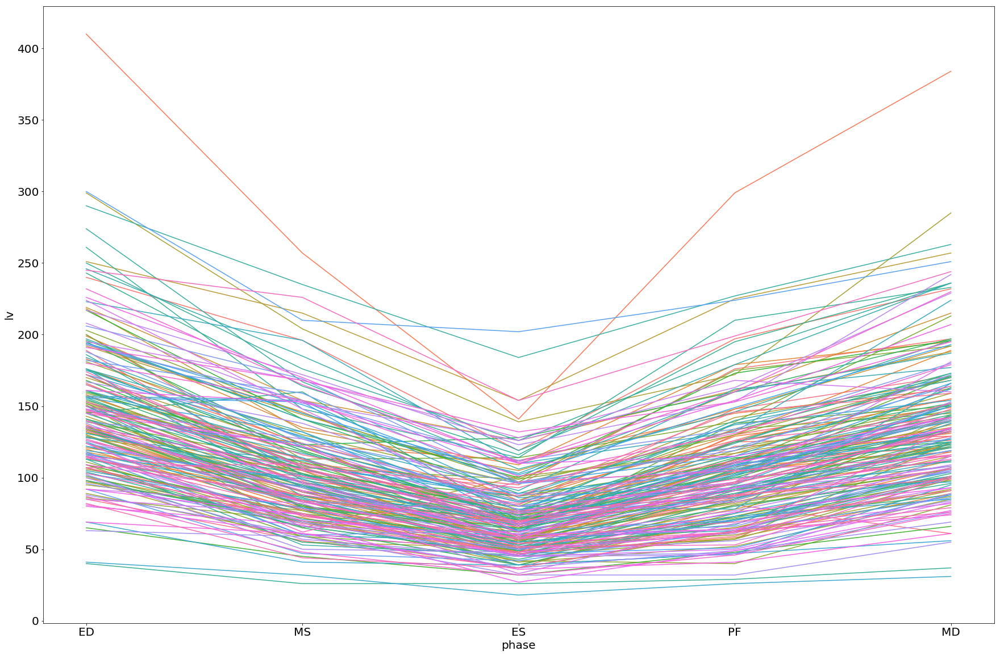

In [45]:
# plot timeseries with error bands
fig, ax = plt.subplots(figsize=(30,20))
sns.lineplot(x="phase", y="lv",
             hue="patient",legend=False,ax=ax,
             data=df_volumes)

In [16]:
set(df_volumes['Outcome y/n'])

{'n', nan, 'y'}

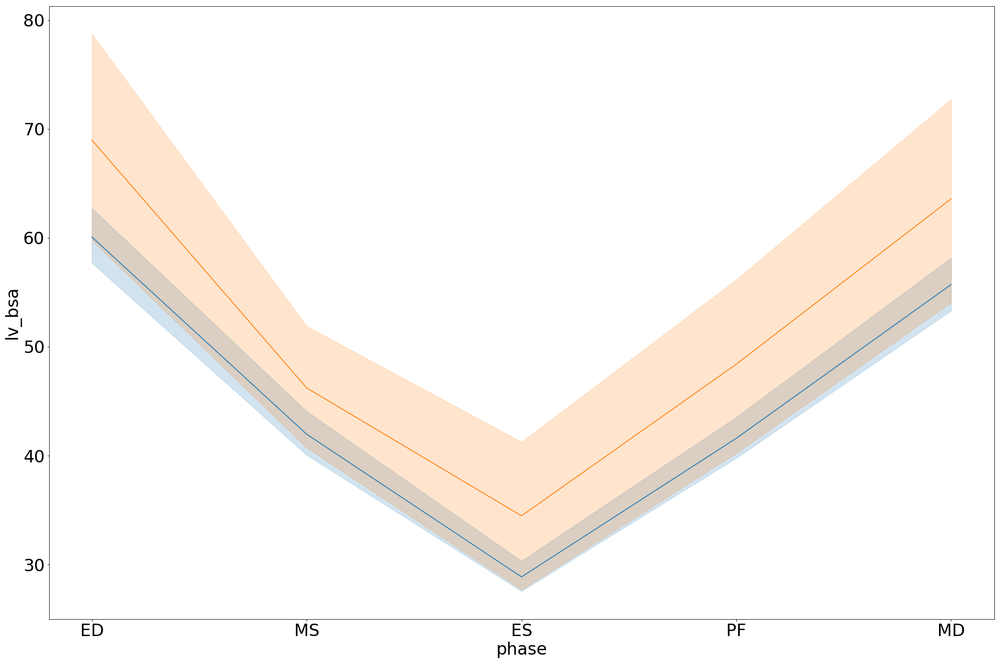

In [191]:
# plot timeseries with error bands
fig, ax = plt.subplots(figsize=(30,20))
ax = sns.lineplot(x="phase", y="lv_bsa",
              err_style='band', ax=ax,
             data=df_volumes[df_volumes['Outcome y/n']=='n'])
ax = sns.lineplot(x="phase", y="lv_bsa",
              err_style='band', ax=ax,
             data=df_volumes[df_volumes['Outcome y/n']=='y'])



In [47]:
df_volumes.head()

,level_0,index,Unnamed: 0,background,rv,myo,lv,y_path,t,t_norm,...,surgery date while enrolled in study OP Datum während Studie,tricuspid insufficiency grades 0-4 tricinsuf,Last Report Date_y,PVR nach MRT y/n,Date PVR,Outcome y/n,Type Outcome_y,Date Outcome,patient_unique,phase
0,0,4,4,11460,171,41,85,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,23,4,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,ED
1,1,0,0,11520,137,44,56,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,5,0,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,MS
2,2,1,1,11589,98,35,37,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,12,1,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,ES
3,3,3,3,11465,165,47,81,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,20,3,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,PF
4,4,2,2,11521,138,39,61,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,16,2,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,MD


# Need to melt the volume df to plot them in a proper way

In [192]:
df = pd.melt(df_volumes, id_vars=[ 'x_path', 'patient', 't', 't_norm', 'phase', 'Outcome y/n'], 
             value_vars=['rv', 'myo', 'lv'], 
             var_name='label', 
             value_name='vol in ml')
df.head()

,x_path,patient,t,t_norm,phase,Outcome y/n,label,vol in ml
0,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,5,0,MS,n,rv,137
1,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,12,1,ES,n,rv,98
2,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,16,2,MD,n,rv,138
3,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,20,3,PF,n,rv,165
4,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,23,4,ED,n,rv,171


In [205]:
# melt the dataframe with the relative volume sizes (divided by bsa)
df_bsa = pd.melt(df_volumes, id_vars=[ 'x_path', 'patient', 't', 't_norm', 'phase', 'Outcome y/n'], 
             value_vars=['rv_bsa', 'myo_bsa', 'lv_bsa'], 
             var_name='label', 
             value_name='vol in ml')
# minor name cleaning
df_bsa['label'] = df_bsa['label'].replace(to_replace='rv_bsa', value='RV')
df_bsa['label'] = df_bsa['label'].replace(to_replace='lv_bsa', value='LV')
df_bsa['label'] = df_bsa['label'].replace(to_replace='myo_bsa', value='MYO')
df_bsa.head()

,x_path,patient,t,t_norm,phase,Outcome y/n,label,vol in ml
0,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,5,0,MS,n,RV,98.325359
1,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,12,1,ES,n,RV,70.334928
2,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,16,2,MD,n,RV,99.043062
3,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,20,3,PF,n,RV,118.421053
4,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,23,4,ED,n,RV,122.727273


Text(0.5, 0, 'Cardiac phases')

Text(0, 0.5, 'Vol in ml/BSA')

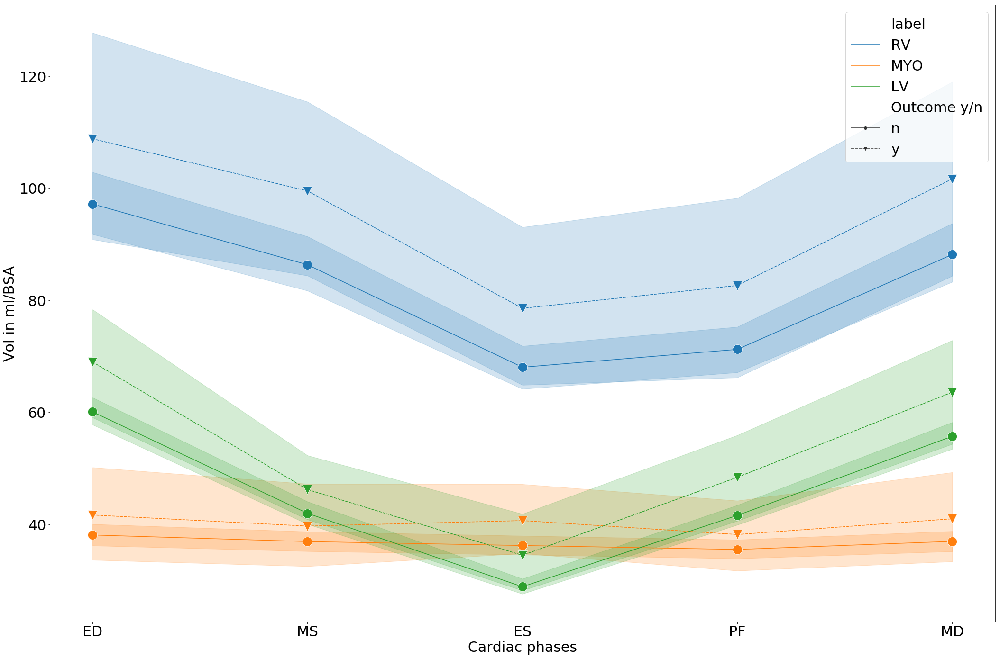

In [206]:
# plot timeseries with error bands, melted dataframe!
# confidence intervall = 0.95
plt.rcParams.update({'font.size': 30})
fig, ax = plt.subplots(figsize=(30,20))

ax = sns.lineplot(x="phase", y="vol in ml",
              hue='label', style='Outcome y/n', markers=['o', 'v'], markersize=20,err_style='band', ax=ax, ci=95,
             data=df_bsa)
#ax.set_title('Volume in ml/BSA for the labelled phases')
plt.xlabel('Cardiac phases', fontsize=30)
plt.ylabel('Vol in ml/BSA', fontsize=30)
plt.tight_layout()
fig.savefig('reports/volume_bsa_over_time_per_outcome.pdf', bbox_inches="tight")

In [218]:
from scipy.stats import ks_2samp

lv = df_bsa[df_bsa['label']=='LV']
#lv = lv[lv['phase']=='ES']
y = lv[lv['Outcome y/n']=='y']['vol in ml']
n = lv[lv['Outcome y/n']=='n']['vol in ml']
ks_2samp(y,n)

Ks_2sampResult(statistic=0.1842105263157895, pvalue=0.03877472653304019)

# Plot each LV over time to identify the ED/ES phases

Text(0.5, 1.0, 'LV volume in ml over the 5 labeled timesteps')

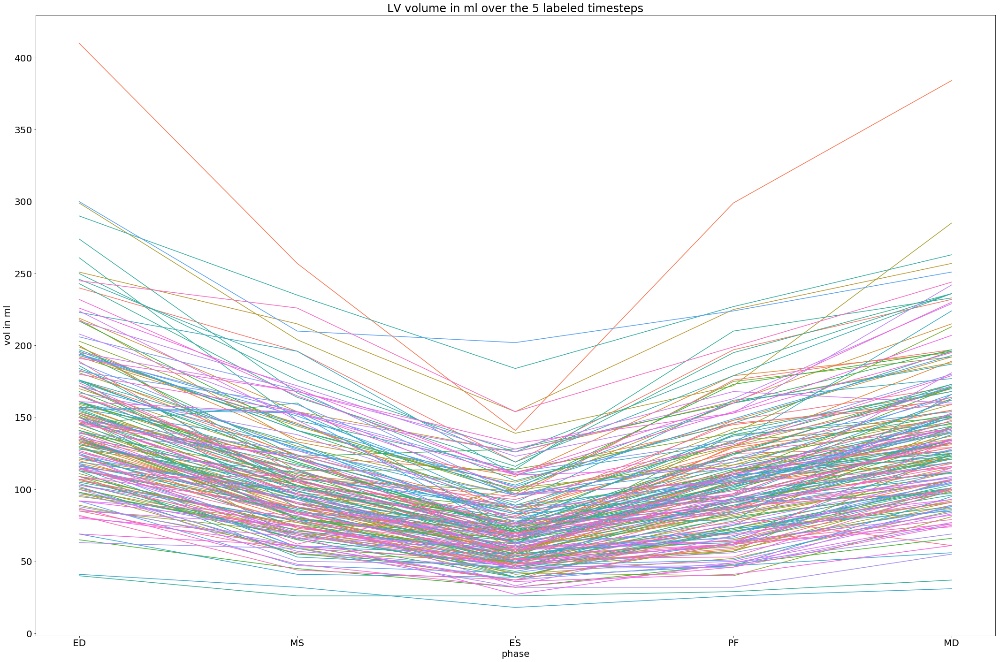

In [50]:
fig, ax = plt.subplots(figsize=(30,20))
ax = sns.lineplot(x="phase", y="vol in ml",
              hue='patient', ax=ax, 
             data=df[df['label'] =='lv'],
                 legend=False)
ax.set_title('LV volume in ml over the 5 labeled timesteps')
plt.tight_layout()

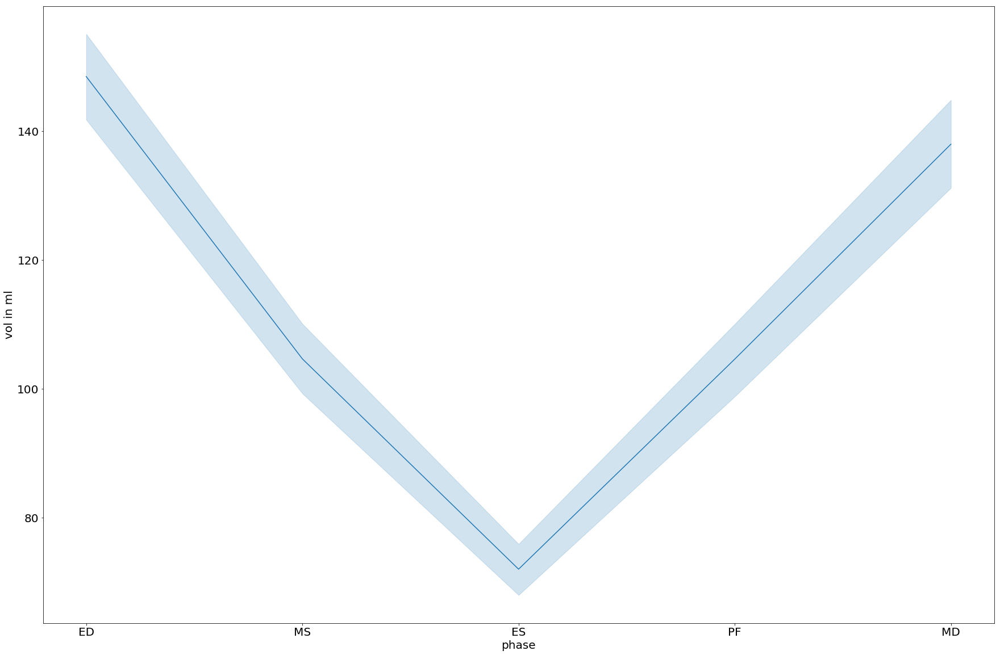

In [51]:
# plot timeseries with error bands
fig, ax = plt.subplots(figsize=(30,20))
ax = sns.lineplot(x="phase", y="vol in ml",
              err_style='band', ci=95, ax=ax,
             data=df[df['label'] =='lv'])

# Find the timestep per patient with min(LV volume) and max(LV volume)

In [52]:
df_lv = df[df['label'] =='lv']
df_lv.shape # 1010 / 202 patients = 5 timesteps per patient

(1015, 7)

In [53]:
# get min and max for 4 rows / one patient
patients = df_lv.patient.unique()
p_temp = patients[0]
print(p_temp)
df_temp = df_lv[df_lv['patient'] == p_temp]
df_temp

04NEJQUZ


,x_path,patient,t,t_norm,phase,label,vol in ml
2030,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,23,4,ED,lv,85
2031,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,5,0,MS,lv,56
2032,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,12,1,ES,lv,37
2033,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,20,3,PF,lv,81
2034,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,04NEJQUZ,16,2,MD,lv,61


In [54]:
# find row with min
idx_min = df_temp['vol in ml'].idxmin()
idx_max = df_temp['vol in ml'].idxmax()
print('min at t: {}'.format(df_temp.loc[idx_min,'t_norm']))
print('max at t: {}'.format(df_temp.loc[idx_max, 't_norm']))

min at t: 1
max at t: 4


Text(0.5, 1.0, 'LV volume for patient: 04NEJQUZ in ml over the 5 labeled timesteps')

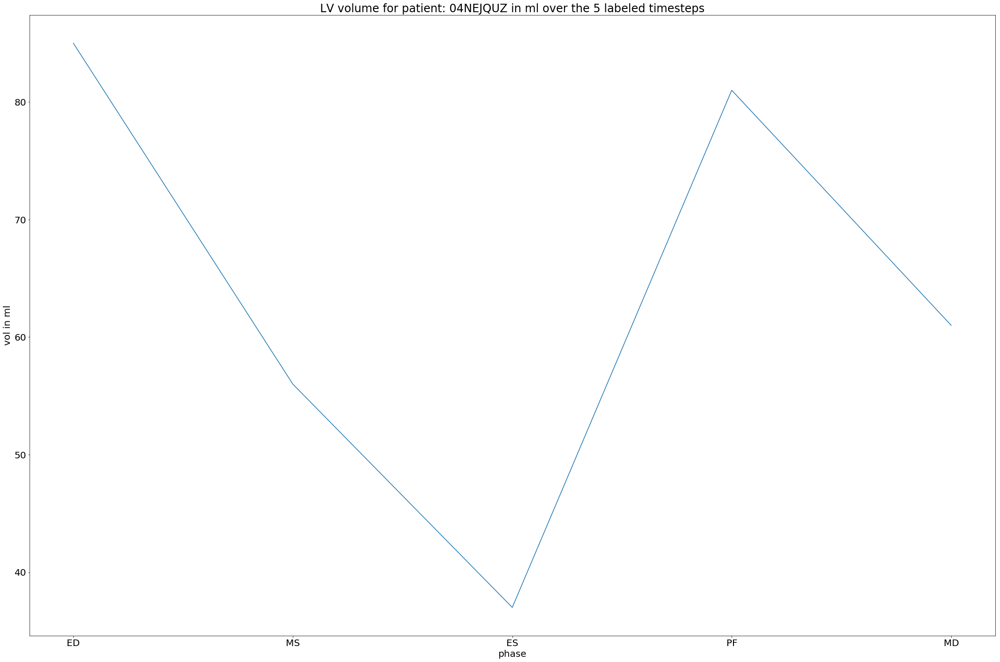

In [55]:
# check the results visually
fig, ax = plt.subplots(figsize=(30,20))
ax = sns.lineplot(x="phase", y="vol in ml",
              hue='patient', ax=ax, 
             data=df_temp,
                 legend=False)
ax.set_title('LV volume for patient: {} in ml over the 5 labeled timesteps'.format(p_temp))
plt.tight_layout()

In [56]:
def get_min_max_t_per_patient(df_patient, col='vol in ml', target_col='t_norm'):
    
    """
    Helper to get min/max of one columns
    returns a dict with {patient: 123abc , min: timestep as int, max: timestep as int}"""
    
    result = dict()
    
    patient = df_patient['patient'].unique()
    assert len(patient) == 1, 'more than one patient in df'

    idx_min = df_patient[col].idxmin()
    idx_max = df_patient[col].idxmax()
    
    result['patient'] = patient[0] 
    result['min_t'] = df_patient.loc[idx_min, target_col]
    result['max_t'] = df_patient.loc[idx_max, target_col]
    
    return result

def get_extremas(df, col='vol in ml', target_col='t_norm'):
    """Helper, returns a dataframe with the timesteps describing the min/max of each patient """
    patients = df['patient'].unique()
    return pd.DataFrame([get_min_max_t_per_patient(df[df['patient'] == p], col, target_col) for p in patients])
    

# Plot the extrema occurence along the labeled timesteps

Text(0.5, 1.0, 'Volume in ml over 5 labeled timesteps')

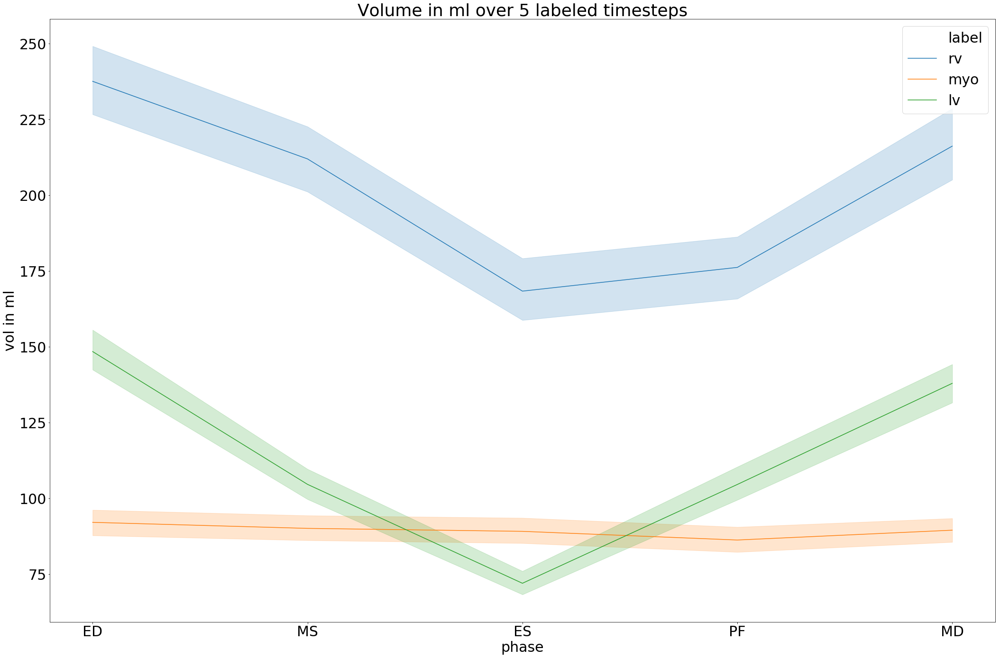

In [68]:
# plot timeseries with error bands, melted dataframe!
# confidence intervall = 0.95
plt.rcParams.update({'font.size': 30})
fig, ax = plt.subplots(figsize=(30,20))
ax = sns.lineplot(x="phase", y="vol in ml",
              hue='label', err_style='band', ax=ax, ci=95,
             data=df)
ax.set_title('Volume in ml over 5 labeled timesteps')
plt.tight_layout()
plt.savefig('reports/avg_volumes_over_time_with_errorbar.pdf')

# in which phase is the LV volume the bigest in our dataset?

Text(0.5, 1.0, 'Phases with the smallest LV volume (ml)')

Text(0, 0.5, '# Patients')

Text(0.5, 0, 'Labeled phases')

Text(0.5, 1.0, 'Phases with the biggest LV volume (ml)')

Text(0.5, 0, 'Labeled phases')

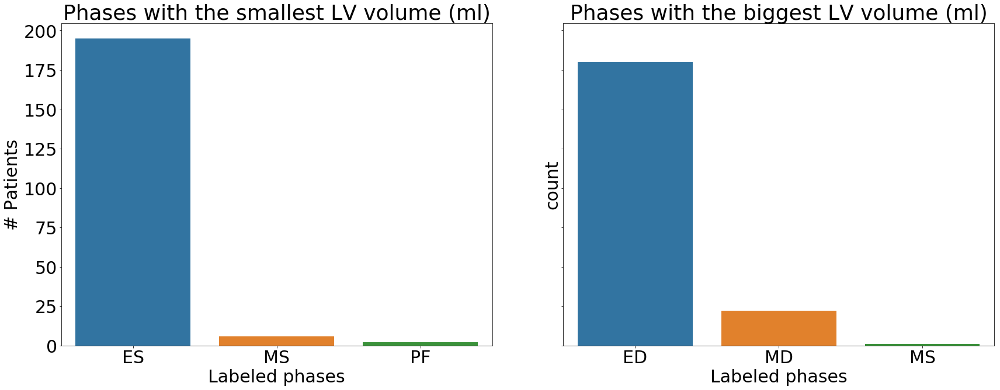

Text(0.5, 1.0, 'Phases with the smallest RV volume (ml)')

Text(0, 0.5, '# Patients')

Text(0.5, 0, 'Labeled phases')

Text(0.5, 1.0, 'Phases with the biggest RV volume')

Text(0.5, 0, 'Labeled phases')

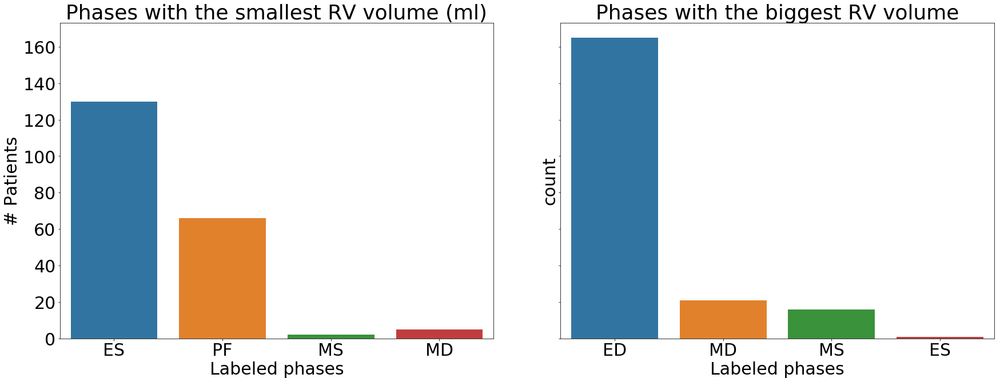

In [69]:
# LV
df_lv = df[df['label'] =='lv']

# get the phases with extrema volume size per patient for the lv volume
extremas = get_extremas(df_lv, target_col='phase')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,10), sharey=True)
ax1 = sns.countplot(extremas['min_t'], ax=ax1)
ax1.set_title('Phases with the smallest LV volume (ml)');
ax1.set_ylabel('# Patients')
ax1.set_xlabel('Labeled phases')
ax2 = sns.countplot(extremas['max_t'],  ax=ax2)
ax2.set_title('Phases with the biggest LV volume (ml)')
ax2.set_xlabel('Labeled phases')
plt.tight_layout()
plt.show()
fig.savefig('reports/phases_with_biggest_size_LV.pdf')
# RV
df_rv = df[df['label'] =='rv']

# get the phases with extrema volume size per patient for the rv volume
extremas = get_extremas(df_rv, target_col='phase')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,10), sharey=True)
ax1 = sns.countplot(extremas['min_t'], ax=ax1)
ax1.set_title('Phases with the smallest RV volume (ml)')
ax1.set_ylabel('# Patients')
ax1.set_xlabel('Labeled phases')
ax2 = sns.countplot(extremas['max_t'],  ax=ax2)
ax2.set_title('Phases with the biggest RV volume')
ax2.set_xlabel('Labeled phases')

plt.tight_layout()
fig.savefig('reports/phases_with_biggest_size_RV.pdf')

In [61]:
@interact
def select_phase(label = df.label.unique(), extrema=['max_t', 'min_t'], phase=df.phase.unique()):
    # define which patietns/phase might matched wrong
    df_label = df[df['label'] ==label]

    # get the phases with extrema volume size per patient for the lv volume
    extremas = get_extremas(df_label, target_col='phase')
    return extremas[extremas[extrema] == phase]

interactive(children=(Dropdown(description='label', options=('rv', 'myo', 'lv'), value='rv'), Dropdown(descrip…

In [62]:
# save dataframe of 3d files to disk, use them for training the voxel morph on 3D data
df_volumes.to_csv('reports/motion/3D/gcn/3d_volumes_with_5_timesteps.csv')

In [63]:
df_volumes = pd.read_csv('reports/motion/3D/gcn/3d_volumes_with_5_timesteps.csv')
df_volumes.head()

,Unnamed: 0,level_0,index,Unnamed: 0.1,background,rv,myo,lv,y_path,t,...,surgery date while enrolled in study OP Datum während Studie,tricuspid insufficiency grades 0-4 tricinsuf,Last Report Date_y,PVR nach MRT y/n,Date PVR,Outcome y/n,Type Outcome_y,Date Outcome,patient_unique,phase
0,0,0,4,4,11460,171,41,85,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,23,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,ED
1,1,1,0,0,11520,137,44,56,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,5,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,MS
2,2,2,1,1,11589,98,35,37,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,12,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,ES
3,3,3,3,3,11465,165,47,81,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,20,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,PF
4,4,4,2,2,11521,138,39,61,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,16,...,NaN,3.0,2018-01-02 00:00:00,y (Homograft),2011-10-11 00:00:00,n,NaN,NaN,04NEJQUZ-2007-03-13,MD


Text(0.5, 0.98, 'ED phase\nRV vol vs LV vol in ml')

Text(0.5, 0.98, 'ES phase \nRV vol vs LV vol in ml')

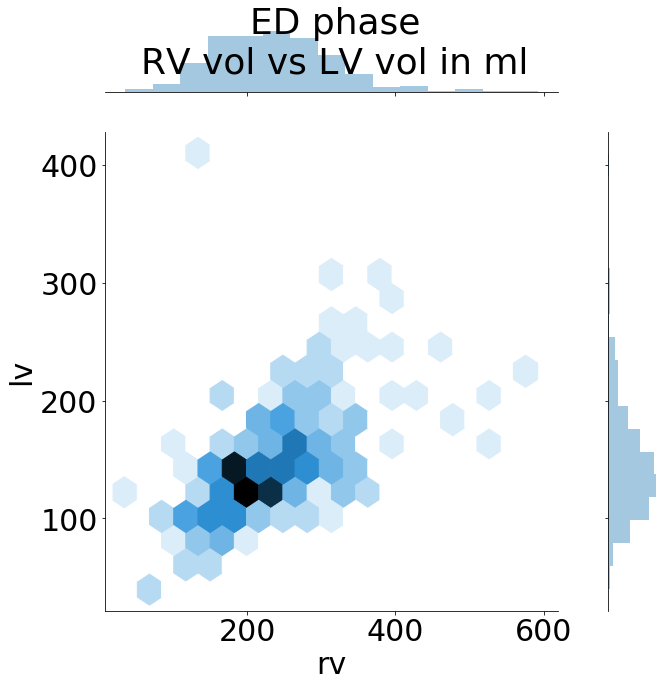

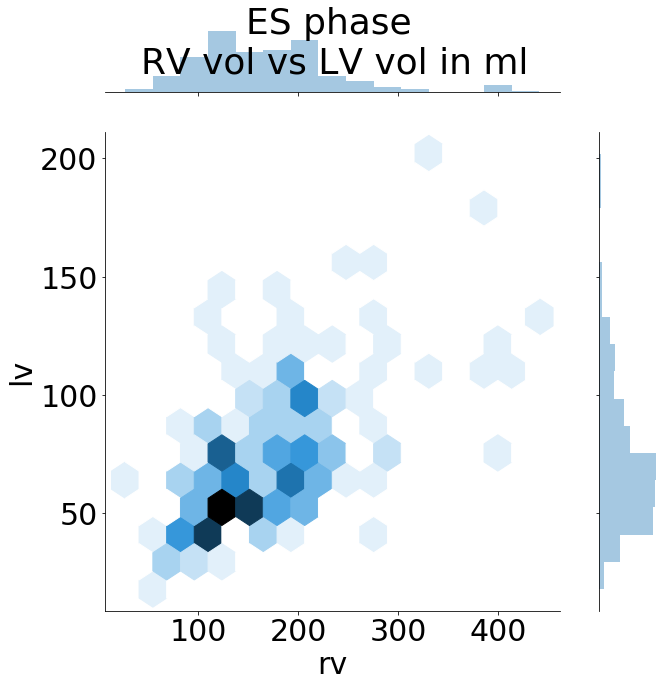

In [66]:
# plot rv & lv volume distribution for each phase
# ED
g = sns.jointplot(x='rv', y='lv', data=df_volumes[df_volumes['phase'] == 'ED'], kind='hex', height=10)
g.fig.suptitle('ED phase\nRV vol vs LV vol in ml')
plt.tight_layout()

# ES
g = sns.jointplot(x='rv', y='lv', data=df_volumes[df_volumes['phase'] == 'ES'], kind='hex', height=10)
g.fig.suptitle('ES phase \nRV vol vs LV vol in ml')
plt.tight_layout()
g.fig.savefig('reports/example_hex_scatterplot.pdf')

# Load the filtered and merged dataframe of all 3D volumes

In [62]:
# read the dataframe with all 3D volumes, filtered by the phases, and merged with the metadata
df_volumes_matched = pd.read_csv('reports/vae/3d_gcn.csv')
# sort by phase
df_volumes_matched['phase'] = pd.Categorical(df_volumes_matched.phase, 
                      categories=['ED','MS','ES','PF',"MD"],
                      ordered=True)
print(df_volumes_matched.shape)
df_volumes_matched.head()

(1015, 150)


,Unnamed: 0,background,rv,myo,lv,y_path,t,t_norm,y_path.1,x_path,...,surgery date while enrolled in study OP Datum während Studie,tricuspid insufficiency grades 0-4 tricinsuf,Last Report Date_y,PVR nach MRT y/n,Date PVR,Outcome y/n,Type Outcome_y,Date Outcome,phase,patient_unique
0,0,11520,137,44,56,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,5,0,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2016-12-06 00:00:00,y (Melody),2012-01-24 00:00:00,n,NaN,NaN,MS,04NEJQUZ-2007-03-13
1,1,11589,98,35,37,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,12,1,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2016-12-06 00:00:00,y (Melody),2012-01-24 00:00:00,n,NaN,NaN,ES,04NEJQUZ-2007-03-13
2,2,11521,138,39,61,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,16,2,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2016-12-06 00:00:00,y (Melody),2012-01-24 00:00:00,n,NaN,NaN,MD,04NEJQUZ-2007-03-13
3,3,11465,165,47,81,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,20,3,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2016-12-06 00:00:00,y (Melody),2012-01-24 00:00:00,n,NaN,NaN,PF,04NEJQUZ-2007-03-13
4,4,11460,171,41,85,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,23,4,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,data/raw/GCN/3D/train/0003-04NEJQUZ-2007-03-13...,...,NaN,3.0,2016-12-06 00:00:00,y (Melody),2012-01-24 00:00:00,n,NaN,NaN,ED,04NEJQUZ-2007-03-13


(203, 103)

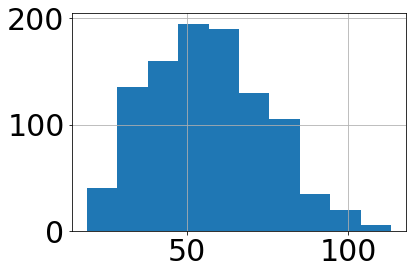

In [142]:
df_['Weight in kg (percentile) weight'].hist()
df_[df_['phase']=='ED'].shape

# Need to check this patients exports

In [63]:
# need to check theese patients
counts = df_volumes_matched.groupby('patient_unique').count()
counts[counts['phase']!= 5]

,Unnamed: 0,background,rv,myo,lv,y_path,t,t_norm,y_path.1,x_path,...,redo after V1 RE OP nach V1,surgery date while enrolled in study OP Datum während Studie,tricuspid insufficiency grades 0-4 tricinsuf,Last Report Date_y,PVR nach MRT y/n,Date PVR,Outcome y/n,Type Outcome_y,Date Outcome,phase
patient_unique,,,,,,,,,,,,,,,,,,,,,


In [79]:
@interact
def inspect_phases(p='patientid'):
    
    files = df_volumes_matched[df_volumes_matched['patient_unique'].str.contains(p)]['file'].values
    if len(files) > 0:
        masks = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in files])
        images = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f.replace('msk', 'img'))) for f in files])
        print(masks.shape)
        print(masks.ndim)
        for img, msk in zip(images, masks):
            #print(img.shape)
            #print(img.mean())
            plot_3d_vol(img, msk)
            
    
    #return df_volumes_matched[df_volumes_matched['patient_unique'].str.contains(p)]

interactive(children=(Text(value='patientid', description='p'), Output()), _dom_classes=('widget-interact',))

In [71]:
@interact
def inspect_df(p_u = 'unique patient id'):
    return df_time[df_time['patient_unique'].str.contains(p_u)]

interactive(children=(Text(value='unique patient id', description='p_u'), Output()), _dom_classes=('widget-int…

# check why some volumes have double size in z direction, e.g.> 4HD5X727

In [81]:
def get_seried_id(path):
    reader = sitk.ImageFileReader()
    reader.SetFileName(path)
    reader.LoadPrivateTagsOn()
    reader.ReadImageInformation()
    return reader.GetMetaData('0020|000e')

In [82]:
# get all files
files = glob.glob('/mnt/data/datasets/cardio/tobedeleted/**/**/*.dcm')
len(files)

1818

In [83]:
# get all series ids
ids = [get_seried_id(f) for f in files]
len(ids)
None not in ids

1818

True

# patient 4HD5X727

In [76]:
# how many series ids do this patient have?
"series ids", len(set(ids))
#get all file names with the series id ...6045
files_ = [f for f in files if get_seried_id(f) == '1.3.12.2.1107.5.2.30.25098.30000006021607263337500006045']
"files", len(files_)

('series ids', 1)

('files', 375)

In [77]:
folders = [os.path.dirname(f) for f in files_]
set(folders)
# solution: --> removed all folders except of ...6045, this works only in this case, because here this folder contains alls images, in other cases the images are split over several folders

{'/mnt/data/datasets/cardio/tobedeleted/0100-4HD5X727-2006-02-16/1.3.12.2.1107.5.2.30.25098.30000006021607263337500006045'}

# patient A2UCK9LD

In [80]:
# how many series ids do this patient have?
"series ids", len(set(ids))
#get all file names with the series id ...6045
files_ = [f for f in files if get_seried_id(f) == '1.3.12.2.1107.5.2.30.25012.3.2006042513102672188935388.0.0.0']
"files", len(files_)

('series ids', 104)

('files', 575)

In [88]:
folders = [os.path.dirname(f) for f in files_]
sorted(set(folders))

['/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.25012.3.2006042513102672188935388.0.0.0',
 '/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.25012.3.200604251310558510835492.0.0.0',
 '/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.25012.3.2006042513112483291135599.0.0.0',
 '/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.25012.3.2006042513115138931935705.0.0.0',
 '/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.25012.3.2006042513123959816235813.0.0.0',
 '/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.25012.3.200604251313215002435913.0.0.0',
 '/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.25012.3.2006042513134741973036025.0.0.0',
 '/mnt/data/datasets/cardio/tobedeleted_1/0201-A2UCK9LD-2006-04-25/1.3.12.2.1107.5.2.30.2501

In [89]:
for f in sorted(set(folders)):
    print(len(glob.glob(os.path.join(f, '*.dcm'))))
# solution: deleted all folders except of '1.3.12.2.1107.5.2.30.25012.3.2006042513102672188935388.0.0.0' 

300
25
25
25
25
25
25
25
25
25
25
25


# patient LLLNJLF6

In [93]:
# how many series ids do this patient have?
"series ids", len(set(ids))
#get all file names with the series id ...6045
files_ = [f for f in files if get_seried_id(f) == '1.3.12.2.1107.5.2.30.25923.30000007020613014715600024420']
"files", len(files_)

('series ids', 11)

('files', 725)

In [95]:
folders = [os.path.dirname(f) for f in files_]
sorted(set(folders))
for f in sorted(set(folders)):
    print(len(glob.glob(os.path.join(f, '*.dcm'))))
# solution delete all folders except of '1.3.12.2.1107.5.2.30.25923.30000007020613014715600024420'

['/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.30000007020613014715600024420',
 '/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.30000007020613014715600024446',
 '/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.30000007020613014715600024472',
 '/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.30000007020613014715600024498',
 '/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.30000007020613014715600024524',
 '/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.30000007020613014715600024550',
 '/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.30000007020613014715600024576',
 '/mnt/data/datasets/cardio/tobedeleted_1/0434-LLLNJLF6-2006-09-27/1.3.12.2.1107.5.2.30.25923.300000070206130147156000

375
25
25
25
25
25
25
25
25
25
25
25
25
25
25


# patient 1KLZMGEG

In [84]:
# how many series ids do this patient have?
"series ids", len(set(ids))
#get all file names with the series id ...6045
files_ = [f for f in files if get_seried_id(f) == '1.3.12.2.1107.5.8.2.04567.200732185541687.6470']
"files", len(files_)

('series ids', 16)

('files', 272)

In [85]:
folders = [os.path.dirname(f) for f in files_]
sorted(set(folders))
for f in sorted(set(folders)):
    print(len(glob.glob(os.path.join(f, '*.dcm'))))
# solution delete all folders except of '1.3.12.2.1107.5.2.30.25923.30000007020613014715600024420'

['/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.200732185541687.6470',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.200732185544562.8889',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.20073218554778.20524',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.200732185549718.997',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.200732185552218.25061',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.200732185554546.6840',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.200732185556921.16869',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.04567.200732185559140.23505',
 '/mnt/data/datasets/cardio/tobedeleted/0025-1KLZMGEG-2007-01-31/1.3.12.2.1107.5.8.2.0

144
16
16
16
16
16
16
16
16
